# This notebook contains all the code for the Non-Temporal analysis and the plots created for the thesis


### Original data received from the hospital was edited to make it suitable for further processing, which is not included in this notebook.
# Importing all the necessary libraries

In [5]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler

# Reading the data

In [6]:
df = pd.read_csv('Thesis-data/merged.csv')
del df["Unnamed: 0"]
df.sort_values(by=['PatientID','Timestamp'], inplace=True,
               ascending = [True,True])
df.index = range(1,len(df)+1)
df = df[['PatientID','Timestamp','WardID', 'Systolic', 'Diastolic', 'O2', 'Pulse', 'Temp', 'Rf', 'Gender','Conciousness']]
df['Timestamp'] = pd.to_datetime(df['Timestamp'],unit='ms',origin='unix')
df

,PatientID,Timestamp,WardID,Systolic,Diastolic,O2,Pulse,Temp,Rf,Gender,Conciousness
1,370,2020-06-01 11:18:37.317,0,167.0,77.0,97.0,70.0,36.2,16.0,M,Våken
2,370,2020-06-01 19:30:50.270,0,144.0,62.0,99.0,85.0,35.8,16.0,M,Våken
3,370,2020-06-02 05:04:19.342,0,138.0,66.0,96.0,69.0,36.2,18.0,M,Våken
4,370,2020-06-02 17:17:51.754,0,172.0,82.0,99.0,62.0,36.0,18.0,M,Våken
5,370,2020-06-03 04:49:18.247,0,155.0,58.0,98.0,63.0,36.3,20.0,M,Våken
...,...,...,...,...,...,...,...,...,...,...,...
29502,1765581,2022-02-27 05:40:00.000,2,111.0,81.0,98.0,60.0,36.2,17.0,0,Våken
29503,1765581,2022-02-27 20:38:42.000,2,125.0,80.0,96.0,70.0,37.0,18.0,0,Våken
29504,1765607,2022-02-27 02:09:58.000,7,129.0,63.0,99.0,97.0,36.1,18.0,0,Våken
29505,1765607,2022-02-27 13:44:39.000,7,116.0,69.0,97.0,78.0,36.2,12.0,0,Våken


# Calculating Minimum, Maximum, Standard Deviation and mean for each vital

In [4]:
PatientIDs = df['PatientID'].unique()
for ID in PatientIDs:
    if (len(df.loc[df['PatientID']==ID])< 3):
        print(ID)
        
headerList = list(df)[3:9]
print(headerList)
Dict={}
for ID in PatientIDs:
    for col in headerList:
        Dict[ID,col,"std"] = df[df["PatientID"]==ID][col].std()
        Dict[ID,col,"min"] = df[df["PatientID"]==ID][col].min()
        Dict[ID,col,"max"] = df[df["PatientID"]==ID][col].max()
        Dict[ID,col,"mean"] = df[df["PatientID"]==ID][col].mean()

columns = ['WardID','Gender','std','min','max', 'mean']
df_Systolic = pd.DataFrame(index = PatientIDs,columns=columns)
df_Systolic = df_Systolic.fillna(0)

df_Diastolic = pd.DataFrame(index = PatientIDs,columns=columns)
df_Diastolic = df_Diastolic.fillna(0)

df_O2 = pd.DataFrame(index = PatientIDs,columns=columns)
df_O2 = df_O2.fillna(0)

df_Pulse = pd.DataFrame(index = PatientIDs,columns=columns)
df_Pulse = df_Pulse.fillna(0)

df_Temp = pd.DataFrame(index = PatientIDs,columns=columns)
df_Temp = df_Temp.fillna(0)

df_Rf = pd.DataFrame(index = PatientIDs,columns=columns)
df_Rf = df_Rf.fillna(0)
# filling the empty Dataframes with the values calculated above
for k in Dict:
    if k[1] == "Systolic":
        df_Systolic.loc[k[0],k[2]] = Dict[k]
        df_Systolic.loc[k[0],'Gender'] = df[df["PatientID"]==k[0]]['Gender'].iloc[0]
        df_Systolic.loc[k[0],'WardID'] = df[df["PatientID"]==k[0]]['WardID'].iloc[0]
    elif k[1] == "Diastolic":
        df_Diastolic.loc[k[0],k[2]] = Dict[k]
        df_Diastolic.loc[k[0],'Gender'] = df[df["PatientID"]==k[0]]['Gender'].iloc[0]
        df_Diastolic.loc[k[0],'WardID'] = df[df["PatientID"]==k[0]]['WardID'].iloc[0]
    elif k[1] == "O2":
        df_O2.loc[k[0],k[2]] = Dict[k]
        df_O2.loc[k[0],'Gender'] = df[df["PatientID"]==k[0]]['Gender'].iloc[0]
        df_O2.loc[k[0],'WardID'] = df[df["PatientID"]==k[0]]['WardID'].iloc[0]
    elif k[1] == "Pulse":
        df_Pulse.loc[k[0],k[2]] = Dict[k]
        df_Pulse.loc[k[0],'Gender'] = df[df["PatientID"]==k[0]]['Gender'].iloc[0]
        df_Pulse.loc[k[0],'WardID'] = df[df["PatientID"]==k[0]]['WardID'].iloc[0]
    elif k[1] == "Temp":
        df_Temp.loc[k[0],k[2]] = Dict[k]
        df_Temp.loc[k[0],'Gender'] = df[df["PatientID"]==k[0]]['Gender'].iloc[0]
        df_Temp.loc[k[0],'WardID'] = df[df["PatientID"]==k[0]]['WardID'].iloc[0]
    elif k[1] == "Rf":
        df_Rf.loc[k[0],k[2]] = Dict[k]
        df_Rf.loc[k[0],'Gender'] = df[df["PatientID"]==k[0]]['Gender'].iloc[0]
        df_Rf.loc[k[0],'WardID'] = df[df["PatientID"]==k[0]]['WardID'].iloc[0]


['Systolic', 'Diastolic', 'O2', 'Pulse', 'Temp', 'Rf']


# Plotting Minimum, Maximum, Standard Deviation and mean for each vital

In [7]:
df_Systolic= df_Systolic.reset_index()
fig = px.scatter(
    df_Systolic, 
    x='WardID', 
    y=['std', 'min', 'max', 'mean'], 
    facet_col='variable', 
    facet_col_wrap=2, 
    hover_name = 'index',
    color='variable', 
    width=1000,
    title ="Systolic by WardID"
)
fig.update_yaxes(showticklabels=True, matches=None)

In [8]:
df_Diastolic= df_Diastolic.reset_index()
fig = px.scatter(
    df_Diastolic, 
    x='WardID', 
    y=['std', 'min', 'max', 'mean'], 
    facet_col='variable', 
    facet_col_wrap=2, 
    hover_name = 'index',
    color='variable', 
    width=1000,
    title ="Diastolic by WardID"
)
fig.update_yaxes(showticklabels=True, matches=None)

In [9]:
df_O2= df_O2.reset_index()
fig = px.scatter(
    df_O2, 
    x='WardID', 
    y=['std', 'min', 'max', 'mean'], 
    facet_col='variable', 
    facet_col_wrap=2, 
    color='variable', 
    hover_name = 'index',
    width=1000,
    title ="O2 by WardID"
)
fig.update_yaxes(showticklabels=True, matches=None)

In [10]:
df_Pulse= df_Pulse.reset_index()
fig = px.scatter(
    df_Pulse, 
    x='WardID', 
    y=['std', 'min', 'max', 'mean'], 
    facet_col='variable', 
    hover_name = 'index',
    facet_col_wrap=2, 
    color='variable', 
    width=1000,
    title ="Pulse by WardID"
)
fig.update_yaxes(showticklabels=True, matches=None)

In [11]:
df_Rf= df_Rf.reset_index()
fig = px.scatter(
    df_Rf, 
    x='WardID', 
    y=['std', 'min', 'max', 'mean'], 
    facet_col='variable', 
    facet_col_wrap=2, 
    color='variable', 
    width=1000,
    hover_name = 'index',
    title ="Rf by WardID"
)
fig.update_yaxes(showticklabels=True, matches=None)

In [12]:
df_Temp= df_Temp.reset_index()

fig = px.scatter(
    df_Temp, 
    x='WardID', 
    y=['std', 'min', 'max', 'mean'], 
    facet_col='variable', 
    facet_col_wrap=2, 
    color='variable', 
    hover_name = 'index',
    width=1000,
    title ="Temperature by WardID"
)
fig.update_yaxes(showticklabels=True, matches=None)

# Creating dataset based on Minimum, Maximum, Standard Deviation and mean for each vital to do pca on it

In [13]:
df_Rf = df_Rf.rename(columns={"std": "rf_std", "min": "rf_min","max":"rf_max","mean":"rf_mean"})
df_Systolic = df_Systolic.rename(columns={"std": "Systolic_std", "min": "Systolic_min","max":"Systolic_max","mean":"Systolic_mean"})
df_Diastolic =df_Diastolic.rename(columns={"std": "Diastolic_std", "min": "Diastolic_min","max":"Diastolic_max","mean":"Diastolic_mean"})
df_Pulse=df_Pulse.rename(columns={"std": "Pulse_std", "min": "Pulse_min","max":"Pulse_max","mean":"Pulse_mean"})
df_O2=df_O2.rename(columns={"std": "O2_std", "min": "O2_min","max":"O2_max","mean":"O2_mean"})
df_Temp=df_Temp.rename(columns={"std": "Temp_std", "min": "Temp_min","max":"Temp_max","mean":"Temp_mean"})


df_Rf = df_Rf.drop(["WardID", "Gender","index"], axis = 1)
df_Diastolic = df_Diastolic.drop(["WardID", "Gender","index"], axis = 1)
df_Pulse = df_Pulse.drop(["WardID", "Gender","index"], axis = 1)
df_O2 = df_O2.drop(["WardID", "Gender","index"], axis = 1)
df_Temp = df_Temp.drop(["WardID", "Gender","index"], axis = 1)

result = pd.concat([df_Systolic, df_Diastolic,df_O2,df_Pulse,df_Temp,df_Rf], axis=1, join='inner')
result= result.set_index('index')
result

,WardID,Gender,Systolic_std,Systolic_min,Systolic_max,Systolic_mean,Diastolic_std,Diastolic_min,Diastolic_max,Diastolic_mean,...,Pulse_max,Pulse_mean,Temp_std,Temp_min,Temp_max,Temp_mean,rf_std,rf_min,rf_max,rf_mean
index,,,,,,,,,,,,,,,,,,,,,
370,0,M,14.515509,138,172,155.200000,10.148892,58,82,69.000000,...,85,69.800000,0.200000,35.8,36.3,36.100000,1.673320,16,20,17.600000
578,0,M,3.304038,112,120,116.250000,9.146948,45,67,56.500000,...,61,58.500000,0.216025,36.5,37.0,36.800000,1.500000,15,18,16.750000
683,0,F,11.846237,135,156,142.333333,1.527525,81,84,82.666667,...,104,85.000000,0.680686,36.4,37.7,36.933333,1.154701,14,16,14.666667
2016,0,F,16.607227,102,143,124.600000,12.700394,49,80,70.600000,...,81,62.200000,0.801249,35.5,37.6,36.480000,2.489980,12,18,15.800000
2024,0,M,25.093160,101,156,132.500000,10.082989,60,81,70.500000,...,70,65.750000,0.704154,35.0,36.6,36.025000,0.957427,16,18,16.750000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1765534,3,0,7.234178,113,126,117.666667,4.932883,72,81,75.333333,...,79,77.333333,0.152753,36.3,36.6,36.433333,0.000000,14,14,14.000000
1765553,3,0,16.563011,115,148,130.666667,4.582576,80,89,85.000000,...,120,105.000000,0.057735,37.0,37.1,37.066667,4.000000,20,28,24.000000
1765555,3,0,15.526322,83,124,107.333333,14.176271,39,79,51.833333,...,78,70.833333,0.213698,36.2,36.7,36.383333,3.777124,14,25,18.666667


## Removing unknown wards to analyze the known patients' relation with their ward

In [15]:
resultNoZero = result[result['WardID'] != 0]
resultNoZero

,WardID,Gender,Systolic_std,Systolic_min,Systolic_max,Systolic_mean,Diastolic_std,Diastolic_min,Diastolic_max,Diastolic_mean,...,Pulse_max,Pulse_mean,Temp_std,Temp_min,Temp_max,Temp_mean,rf_std,rf_min,rf_max,rf_mean
index,,,,,,,,,,,,,,,,,,,,,
355175,7,1,10.034939,98,125,114.800000,3.114482,57,64,60.200000,...,93,74.200000,0.626099,36.1,37.6,36.920000,1.923538,16,21,17.800000
515472,8,0,6.000000,131,143,137.000000,20.207259,46,81,69.333333,...,85,79.000000,0.461880,36.0,36.8,36.533333,1.154701,14,16,15.333333
668834,3,0,4.582576,129,138,134.000000,3.000000,89,95,92.000000,...,65,62.333333,0.057735,36.6,36.7,36.666667,0.000000,18,18,18.000000
744434,2,0,26.702060,108,166,143.500000,12.503333,54,81,72.500000,...,53,51.000000,0.250000,36.9,37.5,37.175000,1.500000,14,17,15.250000
831591,2,0,9.418068,105,126,114.200000,3.781534,66,76,69.600000,...,84,72.200000,0.481664,36.0,37.2,36.380000,1.788854,24,28,24.800000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1765534,3,0,7.234178,113,126,117.666667,4.932883,72,81,75.333333,...,79,77.333333,0.152753,36.3,36.6,36.433333,0.000000,14,14,14.000000
1765553,3,0,16.563011,115,148,130.666667,4.582576,80,89,85.000000,...,120,105.000000,0.057735,37.0,37.1,37.066667,4.000000,20,28,24.000000
1765555,3,0,15.526322,83,124,107.333333,14.176271,39,79,51.833333,...,78,70.833333,0.213698,36.2,36.7,36.383333,3.777124,14,25,18.666667


In [16]:
def getWardString(wardType) :
    if wardType == 2:
        return "Medicine"
    elif wardType == 3:
        return "Surgical or Ortopedics"
    elif wardType == 5:
        return "Neurology"
    elif wardType == 6:
        return "ICU"
    elif wardType == 7:
        return "Obst / Gyn"
    elif wardType == 8:
        return "Observation unit"
    else:
        return "Unknown"

# PCA

Variance ratio PC 1 0.24734382587992756
Variance ratio PC 2 0.20846944130622092
Variance ratio PC 3 0.1408143418142047
Sum variance components:  0.5966276090003532
*******************************************
Loadings:
          W0        W1            Area
0  -1.529926 -0.402026    Systolic_min
1  -1.081828 -0.310543    Systolic_max
2  -1.422794 -0.404453   Systolic_mean
3  -1.338109  0.014081   Diastolic_min
4  -0.921077  0.111155   Diastolic_max
5  -1.292375  0.089125  Diastolic_mean
6  -1.428732  1.202036          O2_min
7  -1.105069  1.374860          O2_max
8  -1.439121  1.450850         O2_mean
9   0.909436  1.168654       Pulse_min
10  1.099441  1.167071       Pulse_max
11  1.119171  1.280829      Pulse_mean
12  0.424788  1.997859        Temp_min
13  0.935027  1.718380        Temp_max
14  0.814835  2.127118       Temp_mean
15  1.118131 -1.114045          rf_min
16  1.235723 -0.846343          rf_max
17  1.427467 -1.150277         rf_mean


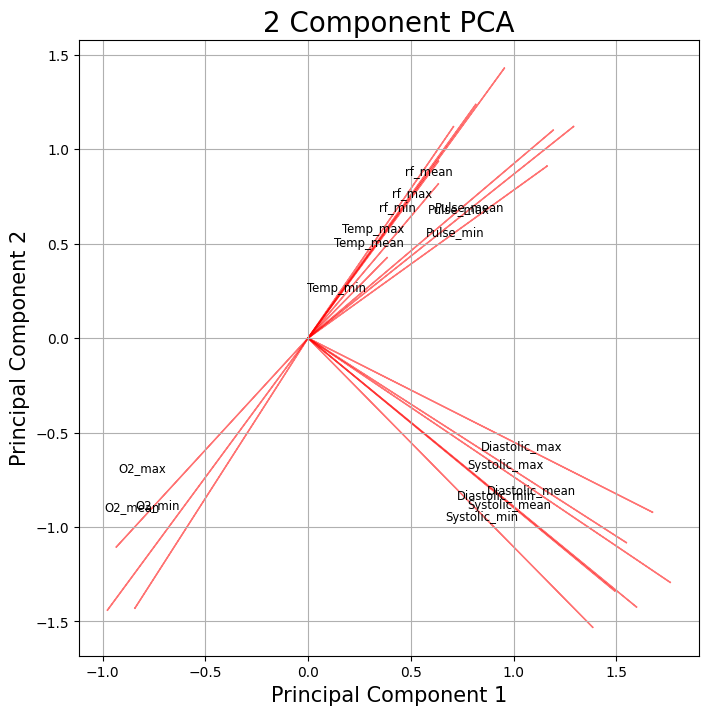

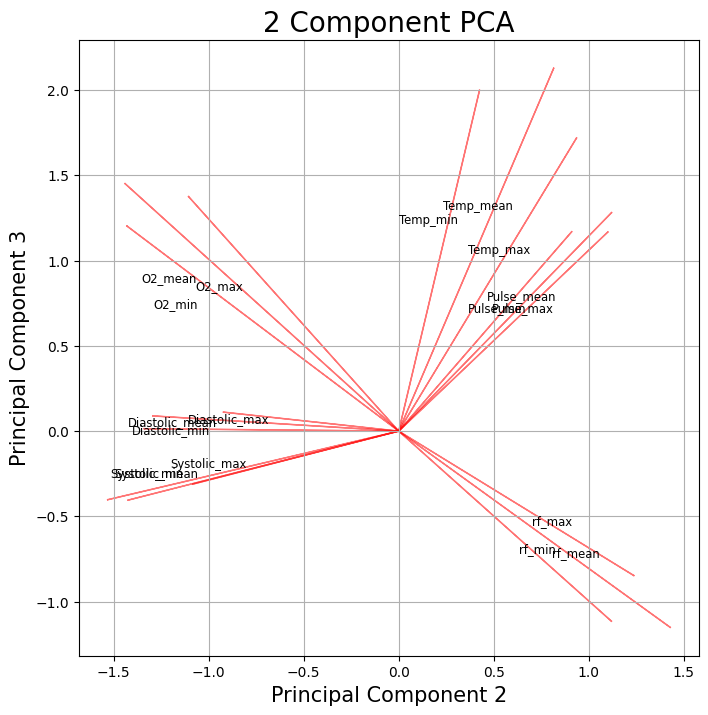

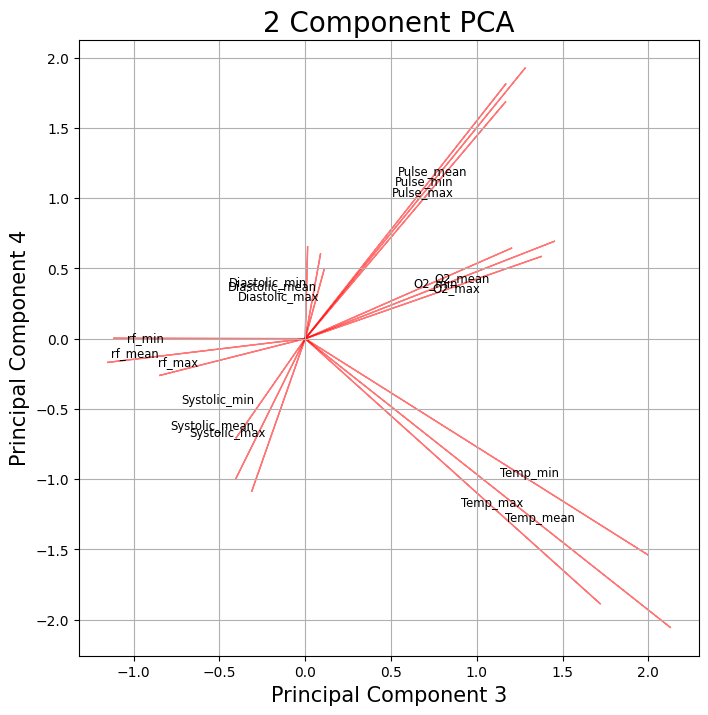

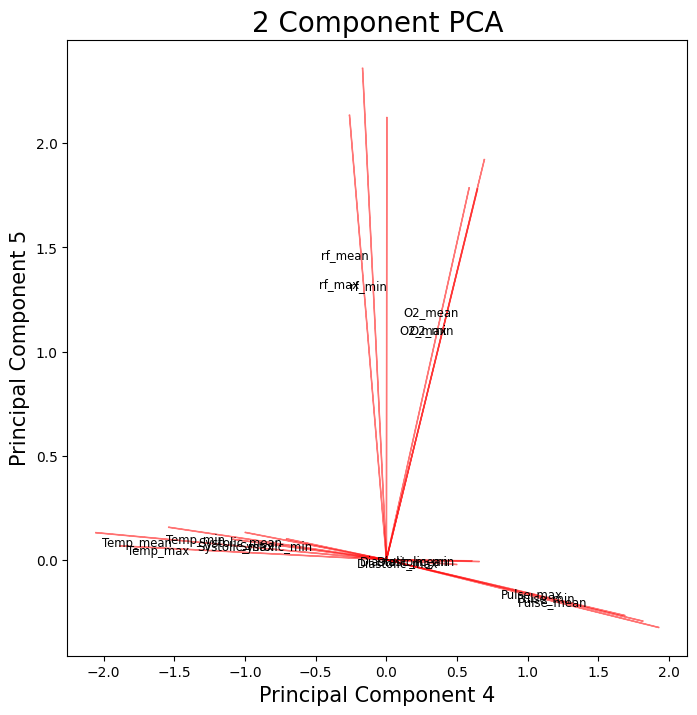

In [22]:
from sklearn.preprocessing import StandardScaler
result_without = resultNoZero.drop(["Systolic_std", "Diastolic_std","Temp_std", "O2_std","rf_std","Pulse_std"], axis = 1)
result_plus = result_without.drop(["Gender","WardID"], axis = 1)

x = StandardScaler().fit_transform(result_plus)
pd.DataFrame(data = x, columns = result_plus.columns).head()
labels = ['PC' + str(x) for x in range(1, 19)]

features = result_plus.columns
pca = PCA(n_components=18)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents
             , columns = labels)
principalDf.head(5)
scaleF = 5

fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 Component PCA', fontsize = 20)
coeff= np.transpose(pca.components_[0:2, :])
n = coeff.shape[0]

for i in range(n):
        plt.arrow(0, 0, coeff[i,0]* scaleF, coeff[i,1]* scaleF,color = 'r',alpha = 0.5)
       # plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'g', ha = 'center', va = 'center')
        plt.text(coeff[i,0]* 3.7, coeff[i,1] * 3.1, features[i], color = 'black', size= 'small', ha = 'right', va = 'center')
ax.grid()

fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 2', fontsize = 15)
ax.set_ylabel('Principal Component 3', fontsize = 15)
ax.set_title('2 Component PCA', fontsize = 20)
coeff= np.transpose(pca.components_[1:3, :])
n = coeff.shape[0]

for i in range(n):
        plt.arrow(0, 0, coeff[i,0]* scaleF, coeff[i,1]* scaleF,color = 'r',alpha = 0.5)
       # plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'g', ha = 'center', va = 'center')
        plt.text(coeff[i,0]* 3.7, coeff[i,1] * 3.1, features[i], color = 'black', size= 'small', ha = 'right', va = 'center')



ax.grid()
v = pca.explained_variance_ratio_
df2 = pd.DataFrame(data= coeff*scaleF, columns=['W0','W1'])
df2['Area']= features

print("Variance ratio PC 1",v[0])
print("Variance ratio PC 2",v[1])
print("Variance ratio PC 3",v[2])
print("Sum variance components: ", v[0]+v[1] +v[2])
print('*******************************************')
print('Loadings:')
print(df2)

fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 3', fontsize = 15)
ax.set_ylabel('Principal Component 4', fontsize = 15)
ax.set_title('2 Component PCA', fontsize = 20)
coeff= np.transpose(pca.components_[2:4, :])
n = coeff.shape[0]

for i in range(n):
        plt.arrow(0, 0, coeff[i,0]* scaleF, coeff[i,1]* scaleF,color = 'r',alpha = 0.5)
       # plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'g', ha = 'center', va = 'center')
        plt.text(coeff[i,0]* 3.7, coeff[i,1] * 3.1, features[i], color = 'black', size= 'small', ha = 'right', va = 'center')
ax.grid()

fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 4', fontsize = 15)
ax.set_ylabel('Principal Component 5', fontsize = 15)
ax.set_title('2 Component PCA', fontsize = 20)
coeff= np.transpose(pca.components_[3:5, :])
n = coeff.shape[0]

for i in range(n):
        plt.arrow(0, 0, coeff[i,0]* scaleF, coeff[i,1]* scaleF,color = 'r',alpha = 0.5)
       # plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'g', ha = 'center', va = 'center')
        plt.text(coeff[i,0]* 3.7, coeff[i,1] * 3.1, features[i], color = 'black', size= 'small', ha = 'right', va = 'center')


## Plotting selected outlier patients based on IDs extracted from PCA and the first part of analysis

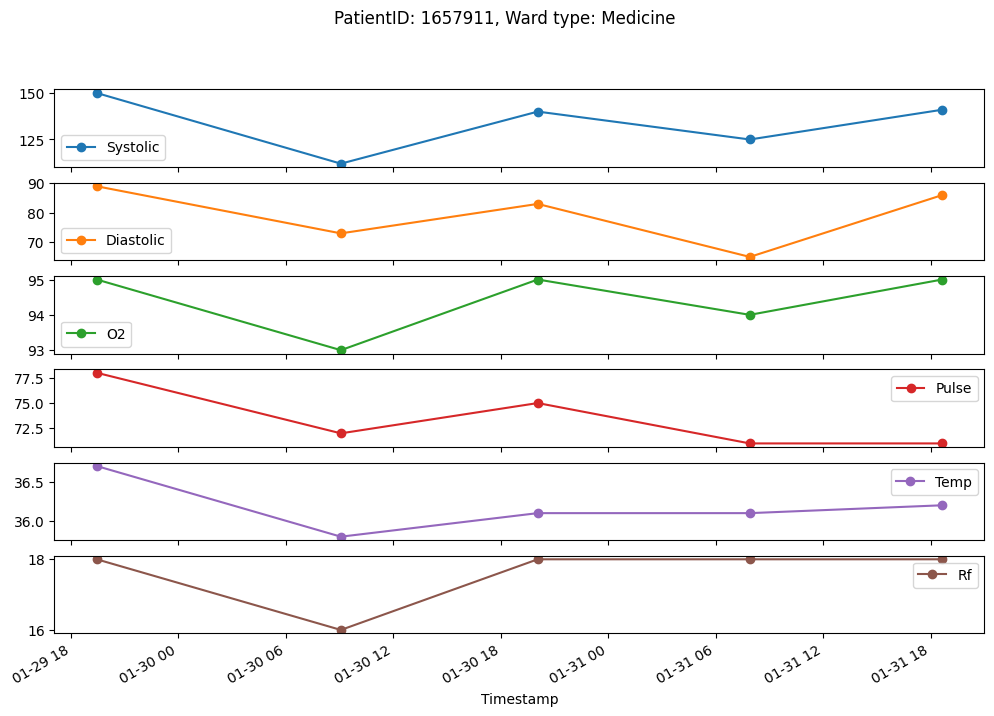

In [21]:
df = pd.read_csv('Thesis-data/Merged.csv')
del df["Unnamed: 0"]
df = df[['PatientID','WardID', 'Timestamp', 'Systolic', 'Diastolic', 'O2','Pulse', 'Temp', 'Rf', 'Gender', 'Conciousness']]
# change ID based on patient you would want to see the plot for
ids = [1657911]
for patientID in ids:
    df['Timestamp'] = pd.to_datetime(df['Timestamp'],unit='ms',origin='unix')
    data = df[df['PatientID'] == patientID]
    ward = data.iloc[0,1]
    data = data.iloc[:,2:9]
    data.set_index('Timestamp', inplace=True)
    # fig.savefig("c:\\temp\\" + str(patientID) + ".png")
    data.plot(figsize=(12,8), style='-o', subplots=True, title="PatientID: " + str(patientID) + ", Ward type: " + getWardString(ward))
    fig = plt.gcf()
    fig.savefig(str(patientID) + ".png")

(1083, 18)


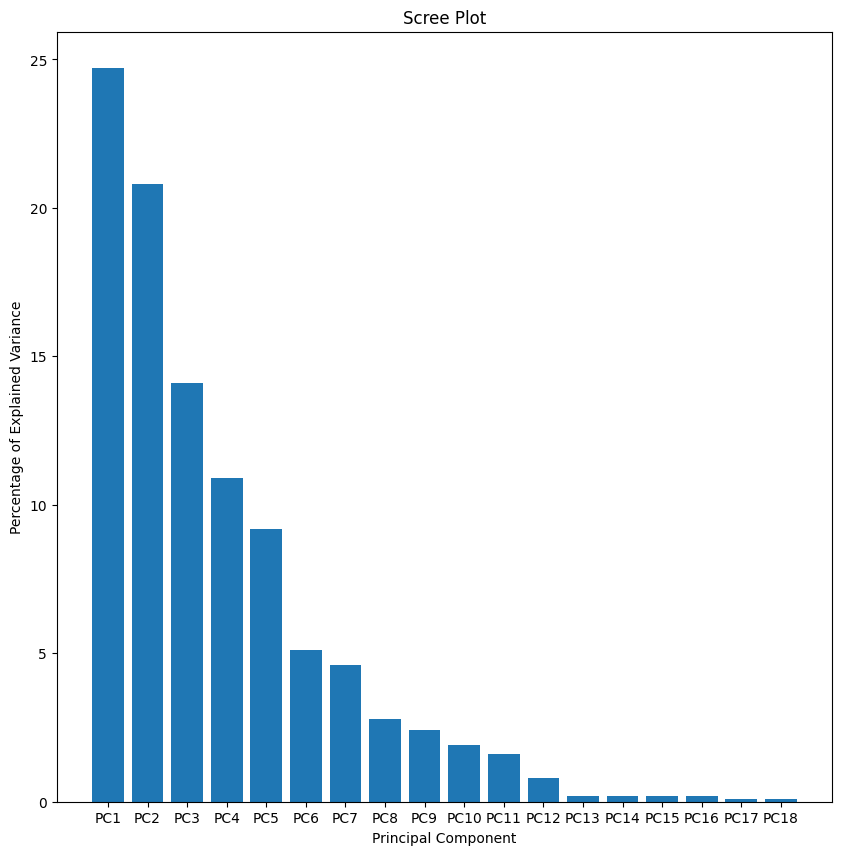

In [23]:
result_withoutSTD = resultNoZero.drop(["Systolic_std", "Diastolic_std","Temp_std", "O2_std","rf_std","Pulse_std"], axis = 1)

result_plus = result_withoutSTD.drop(["Gender","WardID"], axis = 1)
scaled_data = StandardScaler().fit_transform(result_plus)
 
pca = PCA(n_components=18) # create a PCA object
pca.fit(scaled_data) # do the math
pca_data = pca.transform(scaled_data) # get PCA coordinates for scaled_data
print(pca_data.shape)


#The following code constructs the Scree plot
per_var = np.round(pca.explained_variance_ratio_* 100, decimals=1)

labels = ['PC' + str(x) for x in range(1, 19)]
plt.figure(figsize=(10,10)) 
plt.bar(x=range(1,len(per_var)+1), height=per_var, tick_label=labels)
plt.ylabel('Percentage of Explained Variance')
plt.xlabel('Principal Component')
plt.title('Scree Plot')

plt.show()

(1083, 18)
7
Patient ID: 1657911 PC1: 0.1699642782241 PC2: -0.3379409275113387
Patient ID: 1732395 PC1: 3.004587266058602 PC2: 9.83032148884332
Patient ID: 1745594 PC1: -0.8798591345068373 PC2: -0.523177284629001
Patient ID: 1751395 PC1: 5.857238848637813 PC2: -0.08211453014179715


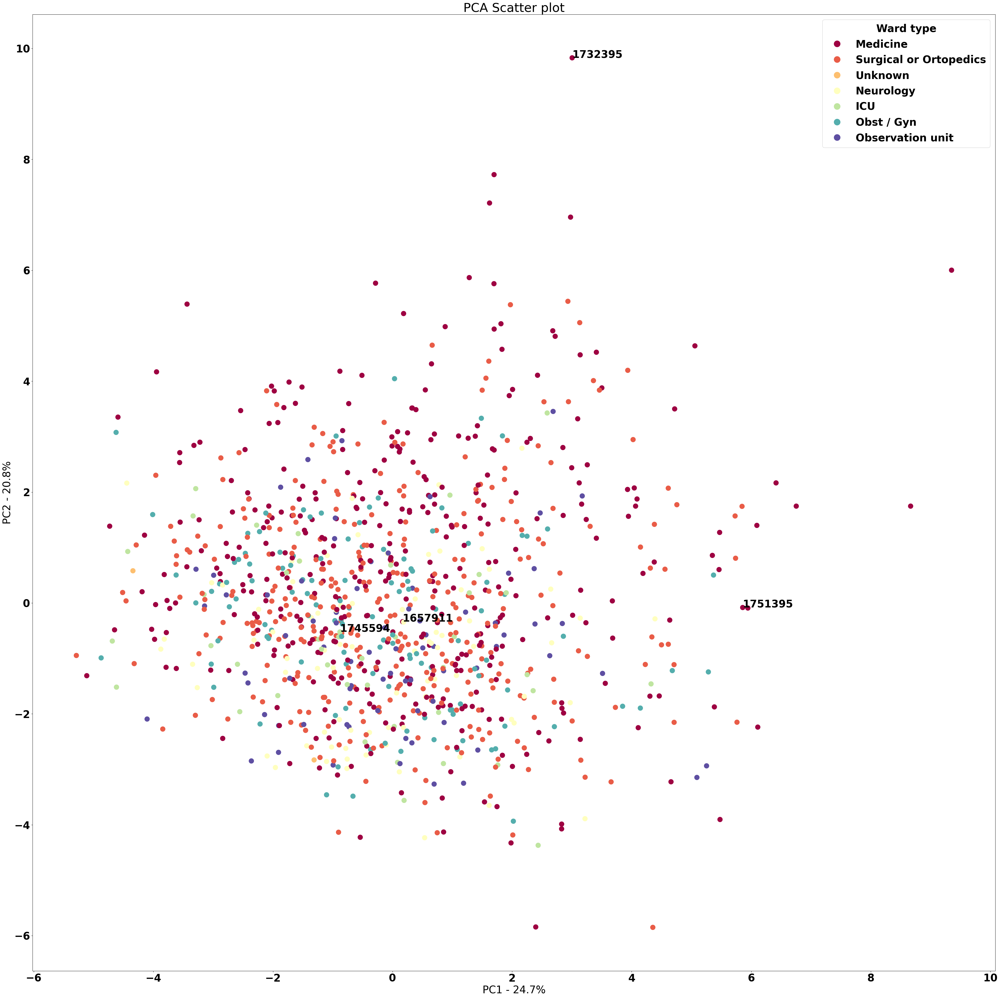

In [29]:
result_plus = result_withoutSTD.drop(["Gender","WardID"], axis = 1)
ids = [1732395,1751395,1745594,1657911]
scaled_data = StandardScaler().fit_transform(result_plus)

pca = PCA(n_components=18) # create a PCA object
pca.fit(scaled_data) # do the math
pca_data = pca.transform(scaled_data) # get PCA coordinates for scaled_data
print(pca_data.shape)


#The following code constructs the Scree plot
per_var = np.round(pca.explained_variance_ratio_* 100, decimals=1)

labels = ['PC' + str(x) for x in range(1, 19)]

#the following code makes a fancy looking plot using PC1 and PC2
Wards = result_withoutSTD['WardID'].unique()
Wards.sort()
Wards = list(map(int, Wards))
ward_strings = []
for Ward in Wards:
    wardString = getWardString(Ward)
    ward_strings.append(wardString)

pca_df = pd.DataFrame(pca_data,index=result_withoutSTD.index, columns=labels)
plt.figure(figsize=(50,50))
scatter = plt.scatter(pca_df.PC1, pca_df.PC2,c=result_withoutSTD['WardID'],cmap="Spectral", s=200 )
plt.title('PCA Scatter plot')
plt.xlabel('PC1 - {0}%'.format(per_var[0]))
plt.ylabel('PC2 - {0}%'.format(per_var[1]))
plt.legend(handles=scatter.legend_elements(num=None)[0],
           labels=ward_strings,
           title="Ward type",
           markerscale=3,
           fontsize=30)

print(len(Wards))
font = {
        'weight' : 'bold',
        'size'   : 30}
plt.rc('font', **font)
plt.rc('axes', labelsize=30)


for sample in pca_df.index:
    if sample in ids:
        plt.annotate(sample, (pca_df.PC1.loc[sample], pca_df.PC2.loc[sample]))
        print("Patient ID:", sample, "PC1:", pca_df.PC1.loc[sample], "PC2:", pca_df.PC2.loc[sample])
        # plt.annotate(sample, (pca_df.PC1.loc[sample], pca_df.PC2.loc[sample]))

plt.savefig('my_plot1.png', dpi=150)
plt.show()
#plt.savefig('my_plot1.png')